In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
comments = pd.read_csv(r'UScomments.csv', error_bad_lines=False)

C:\Users\abhis\AppData\Local\Temp\ipykernel_7316\1606717270.py:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  comments = pd.read_csv(r'UScomments.csv', error_bad_lines=False)
b'Skipping line 41589: expected 4 fields, saw 11\nSkipping line 51628: expected 4 fields, saw 7\nSkipping line 114465: expected 4 fields, saw 5\n'
b'Skipping line 142496: expected 4 fields, saw 8\nSkipping line 189732: expected 4 fields, saw 6\nSkipping line 245218: expected 4 fields, saw 7\n'
b'Skipping line 388430: expected 4 fields, saw 5\n'
C:\Users\abhis\AppData\Local\Temp\ipykernel_7316\1606717270.py:1: DtypeWarning: Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.
  comments = pd.read_csv(r'UScomments.csv', error_bad_lines=False)


In [3]:
comments.head()

,video_id,comment_text,likes,replies
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0
4,XpVt6Z1Gjjo,trending 😉,3,0


In [4]:
comments.isnull().sum()

video_id         0
comment_text    25
likes            0
replies          0
dtype: int64

In [5]:
comments.dropna(inplace=True)

In [6]:
comments.isnull().sum()

video_id        0
comment_text    0
likes           0
replies         0
dtype: int64

# TextBlob Sentiment Analysis

In [7]:
!pip install textblob

In [8]:
from textblob import TextBlob

In [9]:
TextBlob('Say hi to Kong and maverick for me').sentiment

Sentiment(polarity=0.0, subjectivity=0.0)

In [10]:
polarity = []
for comment in comments['comment_text']:
    try:
        polarity.append(TextBlob(comment).sentiment.polarity)
    except:
        polarity.append(0)

In [14]:
comments['polarity'] = polarity

In [15]:
comments.head(20)

,video_id,comment_text,likes,replies,polarity
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0,0.000000
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,0.000000
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,0.000000
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,0.000000
4,XpVt6Z1Gjjo,trending 😉,3,0,0.000000
5,XpVt6Z1Gjjo,#1 on trending AYYEEEEE,3,0,0.000000
6,XpVt6Z1Gjjo,The end though 😭👍🏻❤️,4,0,0.000000
7,XpVt6Z1Gjjo,#1 trending!!!!!!!!!,3,0,0.000000
8,XpVt6Z1Gjjo,Happy one year vlogaversary,3,0,0.800000
9,XpVt6Z1Gjjo,You and your shit brother may have single hand...,0,0,-0.135714


In [16]:
positive_comments = comments[comments['polarity']==1]
negative_comments = comments[comments['polarity']==-1]

# NLTK Vader Sentiment analyzer

In [17]:
!pip install nltk

In [18]:
import nltk
import nltk.corpus

In [19]:
comment = comments['comment_text']
sample_comment = comment[0:1000]
vader_comments = ' '.join(sample_comment)
vader_comments

"Logan Paul it's yo big day ‼️‼️‼️ I've been following you from the start of your vine channel and have seen all 365 vlogs Say hi to Kong and maverick for me MY FAN . attendance trending 😉 #1 on trending AYYEEEEE The end though 😭👍🏻❤️ #1 trending!!!!!!!!! Happy one year vlogaversary You and your shit brother may have single handedly ruined YouTube.....thanks... There should be a mini Logan Paul too! Dear Logan, I really wanna get your Merch but I don't have the money. We don't even have a Car. It would really make my day to have any of your merch Honestly Evan is so annoying. Like its not funny watching him try to be famous he's trying way to hard and I don't like it Casey is still better then logan aw geez rick this guy is the face of YouTube. He happy cause he in a movie Ayyyyoooo Logang what up .  This was a hard vlog to watch Logan how dare are you to destroyed that YouTube bag . Logang Army check my covers and share them  can Logang help me to hit 1,000 Subscribers today, I think w

In [24]:
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist

In [25]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\abhis\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [26]:
tokens = word_tokenize(vader_comments.lower())
tokens[0:10]

['logan', 'paul', 'it', "'s", 'yo', 'big', 'day', '‼️‼️‼️', 'i', "'ve"]

In [28]:
freq = FreqDist(tokens)
freq

FreqDist({'nigger': 1243, 'the': 576, '.': 512, 'i': 347, 'to': 318, ',': 315, 'a': 312, '!': 310, 'it': 286, 'you': 281, ...})

In [29]:
freq.most_common(10)

[('nigger', 1243),
 ('the', 576),
 ('.', 512),
 ('i', 347),
 ('to', 318),
 (',', 315),
 ('a', 312),
 ('!', 310),
 ('it', 286),
 ('you', 281)]

Stemming

In [30]:
from nltk.stem import PorterStemmer
from nltk.stem import LancasterStemmer
pst = PorterStemmer()
lst = LancasterStemmer()

In [31]:
tokens

['logan',
 'paul',
 'it',
 "'s",
 'yo',
 'big',
 'day',
 '‼️‼️‼️',
 'i',
 "'ve",
 'been',
 'following',
 'you',
 'from',
 'the',
 'start',
 'of',
 'your',
 'vine',
 'channel',
 'and',
 'have',
 'seen',
 'all',
 '365',
 'vlogs',
 'say',
 'hi',
 'to',
 'kong',
 'and',
 'maverick',
 'for',
 'me',
 'my',
 'fan',
 '.',
 'attendance',
 'trending',
 '😉',
 '#',
 '1',
 'on',
 'trending',
 'ayyeeeee',
 'the',
 'end',
 'though',
 '😭👍🏻❤️',
 '#',
 '1',
 'trending',
 '!',
 '!',
 '!',
 '!',
 '!',
 '!',
 '!',
 '!',
 '!',
 'happy',
 'one',
 'year',
 'vlogaversary',
 'you',
 'and',
 'your',
 'shit',
 'brother',
 'may',
 'have',
 'single',
 'handedly',
 'ruined',
 'youtube',
 '.....',
 'thanks',
 '...',
 'there',
 'should',
 'be',
 'a',
 'mini',
 'logan',
 'paul',
 'too',
 '!',
 'dear',
 'logan',
 ',',
 'i',
 'really',
 'wan',
 'na',
 'get',
 'your',
 'merch',
 'but',
 'i',
 'do',
 "n't",
 'have',
 'the',
 'money',
 '.',
 'we',
 'do',
 "n't",
 'even',
 'have',
 'a',
 'car',
 '.',
 'it',
 'would',
 'reall

In [32]:
stemmed_tokens = []
for token in tokens:
    stemmed_tokens.append(pst.stem(token))

stemmed_tokens[0:15]

['logan',
 'paul',
 'it',
 "'s",
 'yo',
 'big',
 'day',
 '‼️‼️‼️',
 'i',
 "'ve",
 'been',
 'follow',
 'you',
 'from',
 'the']

Remove Stop Words

In [33]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\abhis\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [34]:
from nltk.corpus import stopwords
a = set(stopwords.words('english'))
new_stemmed_tokens = []
for word in stemmed_tokens:
    if word not in a:
        new_stemmed_tokens.append(word)
new_stemmed_tokens[0:20]

['logan',
 'paul',
 "'s",
 'yo',
 'big',
 'day',
 '‼️‼️‼️',
 "'ve",
 'follow',
 'start',
 'vine',
 'channel',
 'seen',
 '365',
 'vlog',
 'say',
 'hi',
 'kong',
 'maverick',
 'fan']

POS ( Part Of Speech Tagging)

In [35]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\abhis\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [37]:
for token in new_stemmed_tokens:
    print(nltk.pos_tag([token]))

[('logan', 'NN')]
[('paul', 'NN')]
[("'s", 'POS')]
[('yo', 'NN')]
[('big', 'JJ')]
[('day', 'NN')]
[('‼️‼️‼️', 'NN')]
[("'ve", 'VBP')]
[('follow', 'VB')]
[('start', 'NN')]
[('vine', 'NN')]
[('channel', 'NNS')]
[('seen', 'VBN')]
[('365', 'CD')]
[('vlog', 'NN')]
[('say', 'VB')]
[('hi', 'NN')]
[('kong', 'NN')]
[('maverick', 'NN')]
[('fan', 'NN')]
[('.', '.')]
[('attend', 'NN')]
[('trend', 'NN')]
[('😉', 'NN')]
[('#', '#')]
[('1', 'CD')]
[('trend', 'NN')]
[('ayyeeee', 'NN')]
[('end', 'NN')]
[('though', 'IN')]
[('😭👍🏻❤️', 'NN')]
[('#', '#')]
[('1', 'CD')]
[('trend', 'NN')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('happi', 'NN')]
[('one', 'CD')]
[('year', 'NN')]
[('vlogaversari', 'NN')]
[('shit', 'NN')]
[('brother', 'NN')]
[('may', 'MD')]
[('singl', 'NN')]
[('handedli', 'NN')]
[('ruin', 'NN')]
[('youtub', 'NN')]
[('.....', 'NN')]
[('thank', 'NN')]
[('...', ':')]
[('mini', 'NN')]
[('logan', 'NN')]
[('paul', 'NN')]
[('!

[('made', 'VBN')]
[('thi', 'NN')]
[('video', 'NN')]
[('instead', 'RB')]
[('know', 'VB')]
[('logan', 'NN')]
[('paul', 'NN')]
[('make', 'VB')]
[('video', 'NN')]
[('logan', 'NN')]
[('paul', 'NN')]
[('chang', 'NN')]
[('login', 'NN')]
[('forev', 'NN')]
[("n't", 'RB')]
[('chang', 'NN')]
[('shit', 'NN')]
[('anyth', 'NN')]
[('expos', 'NN')]
[('larg', 'NN')]
[('audienc', 'NN')]
[('five', 'CD')]
[('10', 'CD')]
[('year', 'NN')]
[('old', 'JJ')]
[('mayb', 'NN')]
[('even', 'RB')]
[('freshman', 'NN')]
[('high', 'JJ')]
[('school', 'NN')]
[('like', 'IN')]
[('video', 'NN')]
[('peopl', 'NN')]
[('hook', 'NN')]
[('fuck', 'NN')]
[('realli', 'NN')]
[('sad', 'NN')]
[("'s", 'POS')]
[('realli', 'NN')]
[('pathet', 'NN')]
[('entir', 'NN')]
[('audienc', 'NN')]
[('made', 'VBN')]
[('peopl', 'NN')]
[('nobodi', 'NN')]
[('actual', 'JJ')]
[('buy', 'VB')]
[('afford', 'NN')]
[('anyth', 'NN')]
[('without', 'IN')]
[('ask', 'NN')]
[('parent', 'NN')]
[("'s", 'POS')]
[('exactli', 'NN')]
[('audienc', 'NN')]
[('fuck', 'NN')]
[('

[('rapper', 'NN')]
[('use', 'NN')]
[('word', 'NN')]
[('becaus', 'NN')]
[("'s", 'POS')]
[('part', 'NN')]
[('person', 'NN')]
[('histori', 'NN')]
[('.', '.')]
[('grown', 'NN')]
[('ass', 'NN')]
[('woman', 'NN')]
[('still', 'RB')]
[('disbelief', 'NN')]
[('peopl', 'NN')]
[('ca', 'MD')]
[("n't", 'RB')]
[('pinch', 'NN')]
[('empathi', 'NN')]
[('fellow', 'NN')]
[('human', 'NN')]
[('.', '.')]
[("'re", 'VBP')]
[('black', 'JJ')]
[(',', ',')]
[('irrelev', 'NN')]
[('convers', 'NNS')]
[('whether', 'IN')]
[('say', 'VB')]
[('n', 'NN')]
[('word', 'NN')]
[('.', '.')]
[('ca', 'MD')]
[("n't", 'RB')]
[(',', ',')]
[('bottom', 'NN')]
[('line', 'NN')]
[(',', ',')]
[("'re", 'VBP')]
[('still', 'RB')]
[('argu', 'NN')]
[('right', 'NN')]
[('say', 'VB')]
[(',', ',')]
[('well', 'RB')]
[('news', 'NN')]
[(':', ':')]
[("'re", 'VBP')]
[('racist', 'NN')]
[('.', '.')]
[('pewd', 'NN')]
[('behind', 'IN')]
[('.', '.')]
[('thi', 'NN')]
[('anoth', 'DT')]
[('attack', 'NN')]
[('charact', 'NN')]
[('.', '.')]
[('love', 'NN')]
[("'re

[('larg', 'NN')]
[('percentag', 'NN')]
[('pewdiepi', 'NN')]
[("'s", 'POS')]
[('audienc', 'NN')]
[('12', 'CD')]
[('year', 'NN')]
[('old', 'JJ')]
[('white', 'JJ')]
[('boy', 'NN')]
[('think', 'NN')]
[('edgi', 'NN')]
[('say', 'VB')]
[('n', 'NN')]
[('word', 'NN')]
[('.', '.')]
[("n't", 'RB')]
[('see', 'VB')]
[('racist', 'NN')]
[(',', ',')]
[('rather', 'RB')]
[('accid', 'NN')]
[('like', 'IN')]
[('peopl', 'NN')]
[('say', 'VB')]
[('thing', 'NN')]
[('fine', 'NN')]
[('famou', 'NN')]
[('person', 'NN')]
[('say', 'VB')]
[('thi', 'NN')]
[('everyon', 'NN')]
[('lose', 'VB')]
[('head', 'NN')]
[('peopl', 'NN')]
[('mad', 'NN')]
[('becaus', 'NN')]
[('said', 'VBD')]
[('n', 'NN')]
[('word', 'NN')]
[('!', '.')]
[('?', '.')]
[('said', 'VBD')]
[('accid', 'NN')]
[('caus', 'NN')]
[('everyon', 'NN')]
[('doe', 'NN')]
[('word', 'NN')]
[(',', ',')]
[('calm', 'NN')]
[('let', 'VB')]
[('honest', 'NN')]
[('guy', 'NN')]
[(',', ',')]
[('let', 'VB')]
[('word', 'NN')]
[('slip', 'NN')]
[('befor', 'NN')]
[('...', ':')]
[('cmo

[('disappoint', 'NN')]
[('see', 'VB')]
[('still', 'RB')]
[('struggl', 'NN')]
[('realli', 'NN')]
[('respect', 'NN')]
[('influenc', 'NN')]
[('youtub', 'NN')]
[('57', 'CD')]
[('million', 'CD')]
[('audienc', 'NN')]
[('.', '.')]
[('hope', 'NN')]
[('wake', 'NN')]
[('fuck', 'NN')]
[('stop', 'NN')]
[('thi', 'NN')]
[('shit', 'NN')]
[('becaus', 'NN')]
[("'re", 'VBP')]
[('good', 'JJ')]
[(',', ',')]
[('entertain', 'NN')]
[('guy', 'NN')]
[('realli', 'NN')]
[('better', 'RBR')]
[('thi', 'NN')]
[('.', '.')]
[('hope', 'NN')]
[('turn', 'NN')]
[('thing', 'NN')]
[('around', 'IN')]
[('bro', 'NN')]
[('.', '.')]
[('woke', 'NN')]
[('.', '.')]
[("'s", 'POS')]
[('okay', 'NN')]
[('man👌👌', 'NN')]
[('weird', 'NN')]
[(',', ',')]
[('thumb', 'NN')]
[('doe', 'NN')]
[("n't", 'RB')]
[('stay', 'NN')]
[('.', '.')]
[('could', 'MD')]
[('corrupt', 'NN')]
[('youtub', 'NN')]
[('?', '.')]
[('day', 'NN')]
[('nobodi', 'NN')]
[('care', 'NN')]
[('word', 'NN')]
[('day', 'NN')]
[('lose', 'VB')]
[('power', 'NN')]
[('peopl', 'NN')]
[('

[('ever', 'RB')]
[('want', 'NN')]
[('also', 'RB')]
[('trump', 'NN')]
[('support', 'NN')]
[('.', '.')]
[('pewd', 'NN')]
[("n't", 'RB')]
[('anyth', 'NN')]
[('apolog', 'NN')]
[('...', ':')]
[("'s", 'POS')]
[('word', 'NN')]
[('thank', 'NN')]
[('apolog', 'NN')]
[('pewd', 'NN')]
[(',', ',')]
[("n't", 'RB')]
[('lost', 'VBN')]
[('respect', 'NN')]
[('sh', 'NN')]
[('*', 'NN')]
[('happen', 'VB')]
[('carri', 'NN')]
[('dude', 'NN')]
[("'s", 'POS')]
[('word', 'NN')]
[('.', '.')]
[('mayb', 'NN')]
[('ppl', 'NN')]
[("n't", 'RB')]
[('get', 'VB')]
[('butt', 'NN')]
[('hurt', 'NN')]
[('honest', 'NN')]
[('.', '.')]
[("'s", 'POS')]
[('like', 'IN')]
[('said', 'VBD')]
[('voldemort', 'NN')]
[('.', '.')]
[('ai', 'NN')]
[("n't", 'RB')]
[('evil', 'NN')]
[('wizard', 'NN')]
[('gon', 'NN')]
[('na', 'NNS')]
[('come', 'VB')]
[('say', 'VB')]
[('n', 'NN')]
[('word', 'NN')]
[('lol', 'NN')]
[('word', 'NN')]
[('black', 'JJ')]
[('american', 'JJ')]
[('say', 'VB')]
[('n', 'NN')]
[('word', 'NN')]
[("'s", 'POS')]
[('call', 'NN')

[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 

[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 'NN')]
[('nigger', 

[("'m", 'VBP')]
[('appl', 'NN')]
[('fan', 'NN')]
[(',', ',')]
[('iphon', 'NN')]
[('year', 'NN')]
[('past', 'NN')]
[('befor', 'NN')]
[('overcom', 'NN')]
[('boredom', 'NN')]
[('stem', 'NN')]
[('stagnant', 'NN')]
[('design', 'NN')]
[('underwhelm', 'NN')]
[('yearli', 'NN')]
[('reveal', 'NN')]
[('.', '.')]
[('current', 'JJ')]
[('love', 'NN')]
[('gorgeou', 'NN')]
[('s8', 'NN')]
[('plu', 'NN')]
[(',', ',')]
[('howev', 'NN')]
[(',', ',')]
[('iphon', 'NN')]
[('x', 'NN')]
[('absolut', 'NN')]
[('beauti', 'NN')]
[(',', ',')]
[('first', 'RB')]
[('time', 'NN')]
[('year', 'NN')]
[("'m", 'VBP')]
[('actual', 'JJ')]
[('kind', 'NN')]
[('excit', 'NN')]
[('appl', 'NN')]
[('product', 'NN')]
[('.', '.')]
[('also', 'RB')]
[('ca', 'MD')]
[("n't", 'RB')]
[('wait', 'NN')]
[('see', 'VB')]
[('samsung', 'NN')]
[('respond', 'NN')]
[(',', ',')]
[('competit', 'NN')]
[('mean', 'NN')]
[('better', 'RBR')]
[('product', 'NN')]
[('consum', 'NN')]
[('.', '.')]
[('nice', 'JJ')]
[('work', 'NN')]
[('appl', 'NN')]
[(':', ':')]
[

[('.', '.')]
[('xbox', 'NN')]
[('one', 'CD')]
[('x', 'NN')]
[('powerful', 'JJ')]
[('consol', 'NN')]
[('+', 'NN')]
[('iphon', 'NN')]
[('x=', 'NN')]
[('love', 'NN')]
[('back', 'RB')]
[('ugli', 'NN')]
[('someon', 'NN')]
[('help', 'NN')]
[('buy', 'VB')]
[('thi', 'NN')]
[('phone', 'NN')]
[('.', '.')]
[('...', ':')]
[('anyon', 'NN')]
[('?', '.')]
[('come', 'VB')]
[('millionair', 'NN')]
[('&', 'CC')]
[('billionair', 'NN')]
[('anyon', 'NN')]
[('help', 'NN')]
[('look', 'NN')]
[('like', 'IN')]
[('samsung', 'NN')]
[('5.8', 'CD')]
[('inch', 'NN')]
[('x', 'NN')]
[('larger', 'JJR')]
[('iphon', 'NN')]
[('8', 'CD')]
[('5.5', 'CD')]
[('inch', 'NN')]
[('!', '.')]
[('8', 'CD')]
[('ha', 'NN')]
[('button', 'NN')]
[('done', 'VBN')]
[('!', '.')]
[("'m", 'VBP')]
[('go', 'VB')]
[('back', 'RB')]
[('flip', 'NN')]
[('phone', 'NN')]
[('!', '.')]
[('buy', 'VB')]
[('motorola', 'NN')]
[('razr', 'NN')]
[('?', '.')]
[('face', 'NN')]
[('recognit', 'NN')]
[('stupid', 'JJ')]
[('thing', 'NN')]
[('ever', 'RB')]
[('imo', 'NN

[('buy', 'VB')]
[('least', 'JJS')]
[('20', 'CD')]
[('sne', 'NN')]
[('mini', 'NN')]
[('.', '.')]
[('thi', 'NN')]
[('awesom', 'NN')]
[('.', '.')]
[('1:20', 'CD')]
[('xddddddddd', 'NN')]
[('dementor', 'NN')]
[('lmao', 'NN')]
[('freakin', 'NN')]
[('1000.00', 'CD')]
[('cosplay', 'NN')]
[('simul', 'NN')]
[("'ve", 'VBP')]
[('never', 'RB')]
[('prouder', 'NN')]
[(',', ',')]
[('subber', 'NN')]
[('like', 'IN')]
[('3', 'CD')]
[('year', 'NN')]
[(',', ',')]
[('thi', 'NN')]
[('video', 'NN')]
[('got', 'VBD')]
[('one', 'CD')]
[('newssit', 'NN')]
[('.', '.')]
[('thi', 'NN')]
[('true', 'JJ')]
[('omg', 'NN')]
[('😂😂😂', 'NN')]
[('iphon', 'NN')]
[('x.', 'NN')]
[('ca', 'MD')]
[("n't", 'RB')]
[('get', 'VB')]
[('face', 'NN')]
[('unlock', 'NN')]
[('work', 'NN')]
[('.', '.')]
[('ca', 'MD')]
[("n't", 'RB')]
[('scroll', 'NN')]
[('.', '.')]
[('becom', 'NN')]
[('poop', 'NN')]
[('emoji.\\nstart', 'NN')]
[('$', '$')]
[('999', 'CD')]
[('ceo', 'NN')]
[('gay', 'NN')]
[('hi', 'NN')]
[('product', 'NN')]
[('gay', 'NN')]
[('$

[('serious', 'JJ')]
[('wireless', 'NN')]
[('charg', 'NN')]
[('?', '.')]
[('samsung', 'NN')]
[('implement', 'NN')]
[('2', 'CD')]
[('gener', 'NN')]
[('ago', 'RB')]
[('s6', 'NN')]
[('lmao', 'NN')]
[('xd', 'NN')]
[('u', 'NN')]
[('get', 'VB')]
[('rid', 'JJ')]
[('parodi', 'NN')]
[('man', 'NN')]
[('want', 'NN')]
[('thi', 'NN')]
[('phone', 'NN')]
[('bad', 'JJ')]
[('ca', 'MD')]
[("n't", 'RB')]
[('afford', 'NN')]
[('😂😂', 'NN')]
[('local', 'JJ')]
[('radio', 'NN')]
[('station', 'NN')]
[('play', 'NN')]
[('audio', 'NN')]
[('clip', 'NN')]
[('video', 'NN')]
[('“', 'NN')]
[('told', 'NN')]
[('nintendo', 'NN')]
[('switch', 'NN')]
[('’', 'NN')]
[('success', 'NN')]
[('befor', 'NN')]
[('went', 'VBD')]
[('sale', 'NN')]
[('becaus', 'NN')]
[('thought', 'NN')]
[('age', 'NN')]
[('smartphon', 'NN')]
[('one', 'CD')]
[('would', 'MD')]
[('carri', 'NN')]
[('around', 'IN')]
[('game', 'NN')]
[('consol', 'NN')]
[(',', ',')]
[('”', 'NN')]
[('\\n', 'NN')]
[('-tsunekazu', 'NN')]
[('ishihara', 'NN')]
[('made', 'VBN')]
[('ea

[('made', 'VBN')]
[(':', ':')]
[('room', 'NN')]
[(':', ':')]
[('movi', 'NN')]
[('.', '.')]
[('ye', 'NN')]
[('ye', 'NN')]
[('ye', 'NN')]
[('ye', 'NN')]
[('ye', 'NN')]
[('.', '.')]
[('wish', 'NN')]
[('wa', 'NN')]
[('origin', 'NN')]
[('stori', 'NN')]
[('tommi', 'NN')]
[(',', ',')]
[('instead', 'RB')]
[('rememb', 'NN')]
[('hi', 'NN')]
[('earlier', 'RBR')]
[('project', 'NN')]
[(',', ',')]
[("'s", 'POS')]
[('almost', 'RB')]
[('like', 'IN')]
[('thi', 'NN')]
[('film', 'NN')]
[('make', 'VB')]
[('fun', 'NN')]
[('hi', 'NN')]
[('work', 'NN')]
[('.', '.')]
[('doe', 'NN')]
[('voic', 'NN')]
[('good', 'JJ')]
[("n't", 'RB')]
[('know', 'VB')]
[('seen', 'VBN')]
[('anyth', 'NN')]
[('spot', 'NN')]
[('life', 'NN')]
[('great', 'JJ')]
[('trailer', 'NN')]
[(',', ',')]
[('could', 'MD')]
[('excit', 'NN')]
[('thi', 'NN')]
[('movi', 'NN')]
[('!', '.')]
[('also', 'RB')]
[(',', ',')]
[('anyon', 'NN')]
[('know', 'VB')]
[('song', 'NN')]
[('name', 'NN')]
[('?', '.')]
[('first', 'RB')]
[("n't", 'RB')]
[('like', 'IN')]
[

[('doe', 'NN')]
[("n't", 'RB')]
[('win', 'NN')]
[('oscar', 'NN')]
[('swear', 'NN')]
[('fuck', 'NN')]
[('god', 'NN')]
[('trailer', 'NN')]
[('reaction', 'NN')]
[('http', 'NN')]
[(':', ':')]
[('//youtu.be/pkrujtuj75i', 'NN')]
[('reaction', 'NN')]
[('would', 'MD')]
[('much', 'JJ')]
[('better', 'RBR')]
[('without', 'IN')]
[('sexual', 'JJ')]
[('garbag', 'NN')]
[('.', '.')]
[('think', 'NN')]
[('room', 'NN')]
[('would', 'MD')]
[('better', 'RBR')]
[('movi', 'NN')]
[('johnni', 'NN')]
[('wa', 'NN')]
[('vampir', 'NN')]
[('👈', 'NN')]
[('watch', 'NN')]
[('click', 'NN')]
[('icon', 'NN')]
[('see', 'VB')]
[('peopl', 'NN')]
[("'s", 'POS')]
[('entertain', 'NN')]
[('4:30', 'CD')]
[('univers', 'NNS')]
[('compar', 'NN')]
[('human', 'NN')]
[('brain', 'NN')]
[('.', '.')]
[('googl', 'NN')]
[('keyword', 'NN')]
[('search', 'NN')]
[(':', ':')]
[('imag', 'NN')]
[(':', ':')]
[('univers', 'NNS')]
[('+', 'NN')]
[('neuron', 'NN')]
[('hell', 'NN')]
[('thi', 'NN')]
[('clown', 'NN')]
[('come', 'VB')]
[('?', '.')]
[('neve

[('tv', 'NN')]
[('.', '.')]
[('know', 'VB')]
[('someth', 'NN')]
[('terribl', 'NN')]
[('wrong', 'JJ')]
[('hi', 'NN')]
[('brain', 'NN')]
[('.', '.')]
[('carson', 'NN')]
[(',', ',')]
[('pruit', 'NN')]
[(',', ',')]
[('devo', 'NN')]
[('price', 'NN')]
[('deliber', 'NN')]
[('select', 'NN')]
[('trump', 'NN')]
[('bannon', 'NN')]
[('destabil', 'NN')]
[('us', 'PRP')]
[('govern', 'NN')]
[('.', '.')]
[('good', 'JJ')]
[('job', 'NN')]
[('.', '.')]
[('gobshit', 'NN')]
[('!', '.')]
[("'s", 'POS')]
[('harder', 'NN')]
[('becom', 'NN')]
[('best', 'JJS')]
[('nurosurgen', 'NN')]
[('becom', 'NN')]
[('part', 'NN')]
[('public', 'NN')]
[('hous', 'JJ')]
[('trump', 'NN')]
[('liter', 'NN')]
[("n't", 'RB')]
[('know', 'VB')]
[('fredrick', 'NN')]
[('dougla', 'NN')]
[('wa', 'NN')]
[('.', '.')]
[('recent', 'JJ')]
[('discov', 'NN')]
[('lincoln', 'NN')]
[('wa', 'NN')]
[('republican', 'JJ')]
[('(', '(')]
[('befor', 'NN')]
[('republican', 'JJ')]
[('switch', 'NN')]
[('racist', 'NN')]
[('parti', 'NN')]
[('dure', 'NN')]
[('ci

[('wise', 'NN')]
[('.', '.')]
[('glad', 'NN')]
[('never', 'RB')]
[('doctor', 'NN')]
[('wish', 'NN')]
[('ben', 'NN')]
[('carson', 'NN')]
[('wa', 'NN')]
[('grandpa', 'NN')]
[('...', ':')]
[('pleas', 'NNS')]
[('go', 'VB')]
[('bck', 'NN')]
[('surgeri', 'NN')]
[('.', '.')]
[('freak', 'NN')]
[('experi', 'NN')]
[('thi', 'NN')]
[('posit', 'NN')]
[('.', '.')]
[("'s", 'POS')]
[('new', 'JJ')]
[('normal', 'JJ')]
[('administr', 'NN')]
[('.', '.')]
[('imagin', 'NN')]
[('perform', 'NN')]
[('brain', 'NN')]
[('surgeri', 'NN')]
[('without', 'IN')]
[('ani', 'NN')]
[('train', 'NN')]
[('.', '.')]
[('disast', 'NN')]
[('!', '.')]
[('!', '.')]
[('power', 'NN')]
[('posit', 'NN')]
[('world', 'NN')]
[('also', 'RB')]
[('ha', 'NN')]
[('experi', 'NN')]
[('need', 'NN')]
[('experi', 'NN')]
[('get', 'VB')]
[('almost', 'RB')]
[('ani', 'NN')]
[('job', 'NN')]
[('.', '.')]
[('sick', 'NN')]
[('well', 'RB')]
[('peopl', 'NN')]
[('texa', 'NN')]
[('probabl', 'NN')]
[("n't", 'RB')]
[('vote', 'NN')]
[('person', 'NN')]
[('brag', 

[('realli', 'NN')]
[('nice', 'JJ')]
[('phone', 'NN')]
[('price', 'NN')]
[('make', 'VB')]
[('hard', 'JJ')]
[('justifi', 'NN')]
[('someth', 'NN')]
[('like', 'IN')]
[('galaxi', 'NN')]
[('s8', 'NN')]
[('essenti', 'NN')]
[('phone', 'NN')]
[('drop', 'NN')]
[('phone', 'NN')]
[(',', ',')]
[("'re", 'VBP')]
[('lucki', 'NN')]
[('glass', 'NN')]
[('panel', 'NN')]
[("n't", 'RB')]
[('shatter', 'NN')]
[('simultan', 'NN')]
[('...', ':')]
[('screen', 'NN')]
[('back', 'RB')]
[('.', '.')]
[('iphon', 'NN')]
[('buyer', 'NN')]
[('enough', 'RB')]
[('money', 'NN')]
[('anyway', 'RB')]
[('...', ':')]
[('hit', 'NN')]
[('beggar', 'NN')]
[('.', '.')]
[('lol', 'NN')]
[('hmm', 'NN')]
[('ca', 'MD')]
[("n't", 'RB')]
[('say', 'VB')]
[("'m", 'VBP')]
[('look', 'NN')]
[('thi', 'NN')]
[('phone', 'NN')]
[('...', ':')]
[('think', 'NN')]
[("'m", 'VBP')]
[('gon', 'NN')]
[('na', 'NNS')]
[('go', 'VB')]
[('lg', 'NN')]
[('v30', 'NN')]
[('thi', 'NN')]
[('year', 'NN')]
[('.', '.')]
[('hahhaha', 'NN')]
[('fool', 'NN')]
[('...', ':')]


[('vs', 'NN')]
[('termin', 'NN')]
[('dog', 'NN')]
[('roman', 'NN')]
[('ty', 'NN')]
[('die', 'NN')]
[('hat', 'NN')]
[('hi', 'NN')]
[('whi', 'NN')]
[('thi', 'NN')]
[('douchebag', 'NN')]
[('trend', 'NN')]
[('?', '.')]
[('thi', 'NN')]
[('guy', 'NN')]
[('ha', 'NN')]
[('two', 'CD')]
[('jeoffri', 'NN')]
[('!', '.')]
[('countri', 'NN')]
[("'s", 'POS')]
[('breath', 'NN')]
[('lol', 'NN')]
[('sub', 'NN')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('!', '.')]
[('ha', 'NN')]
[('britt', 'NN')]
[('hair', 'NN')]
[('colour', 'NN')]
[('reckon', 'NN')]
[('countri', 'NN')]
[('breath', 'NN')]
[('super', 'NN')]
[('hard', 'JJ')]
[('lol', 'NN')]
[('teach', 'NN')]
[('cora', 'NNS')]
[('suck', 'NN')]
[('deck', 'NN')]
[('whi', 'NN')]
[('bu', 'NN')]
[('nooooooooo', 'NN')]
[("'s", 'POS')]
[('flash', 'NN')]
[('?', '.')]
[('?', '.')]
[('?', '.')]
[('let', 'VB')]
[('dog', 'NN')]
[('wof', 'NN')]
[('wof', 'NN')]
[('wof', 'NN')]
[('wof', 'NN')]
[('wof', 'NN')]
[('hahaha', 'NN')]
[('sold', 'VBN')]
[('alreadi', 

[('best', 'JJS')]
[('youtub', 'NN')]
[('dog', 'NN')]
[('u', 'NN')]
[('fall', 'NN')]
[('?', '.')]
[('dig', 'NN')]
[('new', 'JJ')]
[('hat', 'NN')]
[('😬', 'NN')]
[('put', 'NN')]
[('palm', 'NN')]
[('tree', 'NN')]
[('around', 'IN')]
[('pond', 'NN')]
[('put', 'NN')]
[('smile', 'NN')]
[('logo', 'NN')]
[('corner', 'NN')]
[('make', 'VB')]
[('smaller', 'JJR')]
[('make', 'VB')]
[('look', 'NN')]
[('cleaner', 'NN')]
[('ask', 'NN')]
[('girl', 'NN')]
[('shine', 'NN')]
[('come', 'VB')]
[('day', 'NN')]
[('luck', 'NN')]
[('ohhh', 'NN')]
[('666', 'CD')]
[('like', 'IN')]
[('wa', 'NN')]
[('attack', 'NN')]
[('polic', 'NN')]
[('dog', 'NN')]
[('onc', 'NN')]
[(',', ',')]
[('\\n\\n\\n\\n\\n\\nthat', 'SYM')]
[('wa', 'NN')]
[('best', 'JJS')]
[('use', 'NN')]
[('peanut', 'NN')]
[('butter', 'NN')]
[('ever', 'RB')]
[('.', '.')]
[('roman', 'NN')]
[('ou', 'NN')]
[('workout', 'NN')]
[('video', 'NN')]
[('britteni', 'NN')]
[('hand', 'NN')]
[('broken', 'NN')]
[('like', 'IN')]
[('happi', 'NN')]
[('😊', 'NN')]
[('\\n\\n\\nsmi

[('correct', 'NN')]
[('*', 'NN')]
[('tom', 'NN')]
[('cruis', 'NN')]
[('run', 'VB')]
[('sand', 'NN')]
[('look', 'NN')]
[('screen', 'NN')]
[('junki', 'NN')]
[(',', ',')]
[('love', 'NN')]
[('honest', 'NN')]
[('trailer', 'NN')]
[(',', ',')]
[('continu', 'NN')]
[('love', 'NN')]
[('.', '.')]
[('recent', 'JJ')]
[('video', 'NN')]
[('miss', 'NN')]
[('someth', 'NN')]
[('wa', 'NN')]
[('done', 'VBN')]
[('well', 'RB')]
[('past', 'NN')]
[(':', ':')]
[('paus', 'NN')]
[('.', '.')]
[('know', 'VB')]
[('keep', 'VB')]
[('track', 'NN')]
[('hype', 'NN')]
[('quantiti', 'NN')]
[('also', 'RB')]
[('requir', 'NN')]
[('qualiti', 'NN')]
[('.', '.')]
[(',', ',')]
[('befor', 'NN')]
[('joke', 'NN')]
[(',', ',')]
[('take', 'VB')]
[('2-3', 'JJ')]
[('second', 'JJ')]
[('silent', 'NN')]
[(',', ',')]
[('ok', 'NN')]
[('?', '.')]
[('appreci', 'NN')]
[('guy', 'NN')]
[('take', 'VB')]
[('time', 'NN')]
[('read', 'NN')]
[('comment', 'NN')]
[('pleas', 'NNS')]
[('honest', 'NN')]
[('trailer', 'NN')]
[('get', 'VB')]
[('!', '.')]
[('c

[('ride', 'NN')]
[('constantli', 'NN')]
[('think', 'NN')]
[('put', 'NN')]
[('barrel', 'NN')]
[('head', 'NN')]
[('?', '.')]
[('…', 'NN')]
[('im', 'NN')]
[('watch', 'NN')]
[('thi', 'NN')]
[('colleg', 'NN')]
[('got', 'VBD')]
[('accept', 'NN')]
[('hardboard', 'NN')]
[('iq', 'NN')]
[('43', 'CD')]
[('age', 'NN')]
[('45', 'CD')]
[('last', 'JJ')]
[('bit', 'NN')]
[('question', 'NN')]
[('liter', 'NN')]
[('everi', 'NN')]
[('time', 'NN')]
[('class', 'NN')]
[('...', ':')]
[('construct', 'NN')]
[('build', 'NN')]
[('actual', 'JJ')]
[('sound', 'NN')]
[('cool', 'NN')]
[(',', ',')]
[('never', 'RB')]
[('complet', 'NN')]
[('finish', 'NN')]
[('colleg', 'NN')]
[('.', '.')]
[('loud', 'NN')]
[(',', ',')]
[('yelli', 'NN')]
[('dude', 'NN')]
[('blue', 'NN')]
[('shirt', 'NN')]
[('...', ':')]
[('spot', 'NN')]
[('.', '.')]
[('everi', 'NN')]
[('day', 'NN')]
[(',', ',')]
[('want', 'NN')]
[('kick', 'NN')]
[('guy', 'NN')]
[('right', 'NN')]
[('nut', 'NN')]
[('...', ':')]
[('wa', 'NN')]
[('cute', 'NN')]
[('omg', 'NN')]
[

[('neo', 'NN')]
[('nazi', 'NN')]
[('fascist+rapist', 'NN')]
[('look', 'NN')]
[('straight', 'NN')]
[('ahead', 'RB')]
[('see', 'VB')]
[('antica', 'NN')]
[('member', 'NN')]
[('destroy', 'NN')]
[('trash', 'NN')]
[('becaus', 'NN')]
[('wast', 'NN')]
[('time', 'NN')]
[('gender', 'NN')]
[('studi', 'NN')]
[('leav', 'NN')]
[('children', 'NNS')]
[('destroy', 'NN')]
[('mind', 'NN')]
[('ridicul', 'NN')]
[('thought', 'NN')]
[('basic', 'JJ')]
[('tell', 'NN')]
[('white', 'JJ')]
[('one', 'CD')]
[('becom', 'NN')]
[('slave', 'NN')]
[('would', 'MD')]
[('say', 'VB')]
[('someth', 'NN')]
[('straight', 'NN')]
[('peopl', 'NN')]
[("'m", 'VBP')]
[('afraid', 'NN')]
[('even', 'RB')]
[('men', 'NNS')]
[('......', 'NN')]
[('oh', 'NN')]
[('shit', 'NN')]
[('yep', 'NN')]
[('got', 'VBD')]
[('stab', 'NN')]
[('beaten', 'NN')]
[('bike', 'NN')]
[('lock', 'NN')]
[('\\n\\nthank', 'NN')]
[('read', 'NN')]
[('proper', 'NN')]
[('script', 'NN')]
[('thi', 'NN')]
[('skit', 'NN')]
[("'m", 'VBP')]
[('appli', 'NN')]
[('thi', 'NN')]
[('y

Named Entity Recognition

In [38]:
nltk.download('maxent_ne_chunker')

[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\abhis\AppData\Roaming\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!


True

In [39]:
nltk.download('words')

[nltk_data] Downloading package words to
[nltk_data]     C:\Users\abhis\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [40]:
!pip install svgling

In [41]:
from nltk import ne_chunk
tags = nltk.pos_tag(new_stemmed_tokens)
chunk = ne_chunk(tags)
chunk

Chunking

In [42]:
reg = 'NP: {<DT>?<JJ>*<NN>}'
a = nltk.RegexpParser(reg)
result = a.parse(tags)
print(result)

(S
  (NP logan/NN)
  (NP paul/NN)
  's/POS
  (NP yo/JJ big/JJ day/NN)
  ‼️‼️‼️/NNP
  've/VBP
  (NP follow/JJ start/NN)
  (NP vine/NN)
  (NP channel/NN)
  seen/VBN
  365/CD
  vlog/NNS
  say/VBP
  (NP hi/NN)
  (NP kong/JJ maverick/NN)
  (NP fan/NN)
  ./.
  attend/VB
  (NP trend/NN)
  😉/NNP
  #/#
  1/CD
  (NP trend/NN)
  (NP ayyeeee/JJ end/NN)
  though/IN
  😭👍🏻❤️/JJ
  #/#
  1/CD
  (NP trend/NN)
  !/.
  !/.
  !/.
  !/.
  !/.
  !/.
  !/.
  !/.
  !/.
  (NP happi/NN)
  one/CD
  (NP year/NN)
  (NP vlogaversari/NN)
  shit/VBD
  (NP brother/NN)
  may/MD
  singl/VB
  (NP handedli/NN)
  (NP ruin/NN)
  (NP youtub/NN)
  ...../NNP
  (NP thank/NN)
  .../:
  (NP mini/NN)
  (NP logan/NN)
  (NP paul/NN)
  !/.
  (NP dear/JJ logan/NN)
  ,/,
  realli/VB
  (NP wan/NN)
  na/TO
  get/VB
  merch/JJ
  n't/RB
  (NP money/NN)
  ./.
  n't/RB
  even/RB
  (NP car/NN)
  ./.
  would/MD
  realli/VB
  make/VB
  (NP day/NN)
  ani/IN
  (NP merch/NN)
  (NP honestli/NN)
  (NP evan/NN)
  (NP annoy/NN)
  ./.
  like/IN
  (NP fu

In [43]:
result

Vader SentimentAnalyzer

In [44]:
!pip install VaderSentiment

In [45]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [46]:
def sentiment_scores(sentence):
    sid_obj = SentimentIntensityAnalyzer()
    sentiment_dict = sid_obj.polarity_scores(sentence)
    sentiment_dict = sid_obj.polarity_scores(sentence)
    print("Overall sentiment dictionary is : ", sentiment_dict)
    print("Data was rated as ", sentiment_dict['neg']*100, "% Negative")
    print("Data was rated as ", sentiment_dict['neu']*100, "% Neutral")
    print("Data was rated as ", sentiment_dict['pos']*100, "% Positive")
    print("Data Overall Rated As", end = " ")
    if sentiment_dict['compound']>=0.05:
        print('Positive')
    elif sentiment_dict['compound']<=0.05:
        print('Negative')
    else:
        print('Neutral')

In [47]:
sentiment_scores(new_stemmed_tokens)

Overall sentiment dictionary is :  {'neg': 0.057, 'neu': 0.778, 'pos': 0.164, 'compound': 0.9512}
Data was rated as  5.7 % Negative
Data was rated as  77.8 % Neutral
Data was rated as  16.400000000000002 % Positive
Data Overall Rated As Positive


# WordCloud

In [48]:
!pip install wordcloud

In [49]:
from wordcloud import WordCloud, STOPWORDS

In [50]:
tp= positive_comments['comment_text']
tp

64                                          yu are the best
156       Power is the disease.  Care is the cure.  Keep...
227       YAS Can't wait to get it! I just need to sell ...
307                                       This is priceless
319                                     Summed up perfectly
                                ...                        
691373                               Perfect. Every version
691383                                    Me encantaaaaa <3
691388                                     Best song ever 🤘
691389                                excellent performance
691393                                                   <3
Name: comment_text, Length: 19390, dtype: object

In [51]:
total_positive_comments = ' '.join(tp)

In [52]:
total_positive_comments[0:100]

'yu are the best Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as bes'

In [53]:
import unicodedata
tc1 = unicodedata.normalize("NFKD", total_positive_comments)

In [54]:
tc1[0:100]

'yu are the best Power is the disease.  Care is the cure.  Keep caring for yourself and others as bes'

(-0.5, 399.5, 199.5, -0.5)

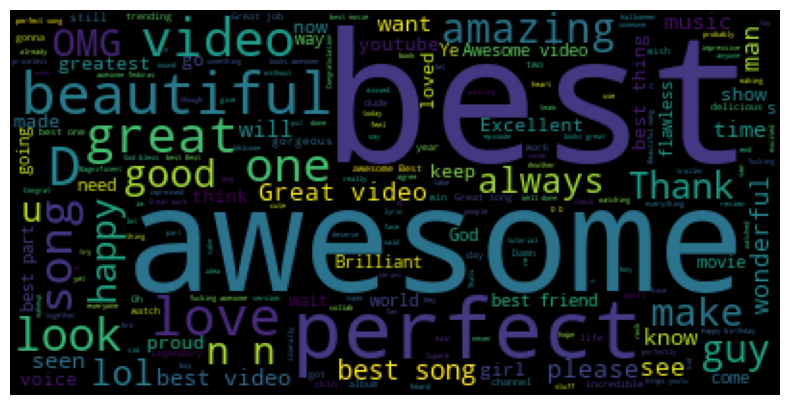

In [55]:
wordcloud = WordCloud(stopwords=set(STOPWORDS)).generate(tc1)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

In [56]:
tn = negative_comments['comment_text']
tn

512       BEN CARSON IS THE MAN!!!!! THEY HATE HIM CAUSE...
562       Well… The brain surgeon Ben Carson just proved...
952              WHY DID YOU MAKE FURRY FORCE?! SO NASTY!!!
1371                                         WTF BRUH!!!!!!
1391                        cheeseus christ thats insane!!!
                                ...                        
690788                                  Like Kelly she evil
690865                       R U FUCKING KIDDING ME?!?!?!?!
691073             This is horribly offensive please report
691180    Sink holes looks terrifying sinkholes sink you...
691224    Trump talked to the president of US Virgin Isl...
Name: comment_text, Length: 3508, dtype: object

In [57]:
tn2 = ' '.join(tn)
tn2[0:200]

"BEN CARSON IS THE MAN!!!!! THEY HATE HIM CAUSE HE EXPOSED HITLARY'S RITUAL ABUSE ON CHILDREN!!!!!!! Well… The brain surgeon Ben Carson just proved how truly insane he is… WHY DID YOU MAKE FURRY FORCE?"

(-0.5, 399.5, 199.5, -0.5)

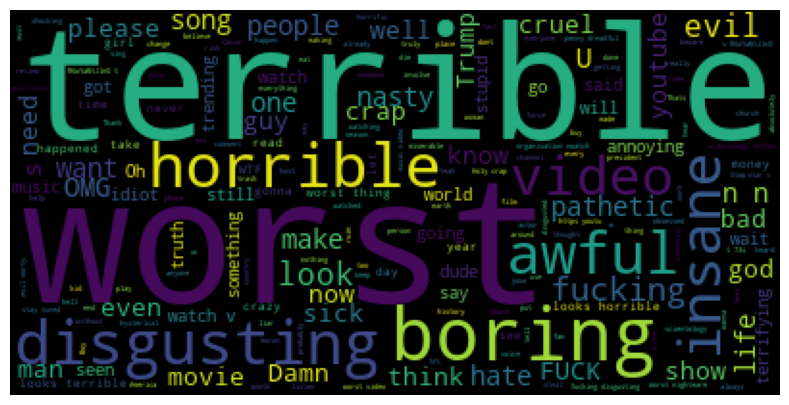

In [58]:
wordcloud = WordCloud(stopwords=set(STOPWORDS)).generate(tn2)
plt.figure(figsize=(15,5))
plt.imshow(wordcloud)
plt.axis('off')

# Emoji Analysis

In [62]:
!pip install emoji

In [65]:
import emoji
comments.head()
emoji

<module 'emoji' from 'C:\\Users\\abhis\\anaconda3\\lib\\site-packages\\emoji\\__init__.py'>

In [66]:
emoji_list = []
for comment in comments['comment_text'].dropna():
    for char in comment:
        if char in emoji.EMOJI_DATA:
            emoji_list.append(char)

emoji_list[0:20]

['‼',
 '‼',
 '‼',
 '😉',
 '😭',
 '👍',
 '🏻',
 '❤',
 '😍',
 '💋',
 '💙',
 '👍',
 '👈',
 '😂',
 '🔥',
 '😂',
 '😂',
 '😂',
 '😂',
 '👻']

In [67]:
from collections import Counter

In [68]:
Counter(emoji_list).most_common(10)

[('😂', 36987),
 ('😍', 33453),
 ('❤', 31119),
 ('🔥', 8694),
 ('😭', 8398),
 ('👏', 5719),
 ('😘', 5545),
 ('👍', 5476),
 ('💖', 5359),
 ('💕', 5147)]

In [69]:
emojis=[]
frequency = []
for emoji,freq in Counter(emoji_list).most_common(10):
    emojis.append(emoji)
    frequency.append(freq)

In [70]:
emojis

['😂', '😍', '❤', '🔥', '😭', '👏', '😘', '👍', '💖', '💕']

In [71]:
frequency

[36987, 33453, 31119, 8694, 8398, 5719, 5545, 5476, 5359, 5147]

In [72]:
!pip install plotly

In [73]:
!pip install chart-studio

In [74]:
import plotly.graph_objs as go
from plotly.offline import iplot
trace=go.Bar(x=emojis,y=frequency)
iplot([trace])

# Collecting entire data of Youtube

In [75]:
import os
path = r'C:\Users\abhis\Downloads\Compressed\Data\Youtube_project_shan_singh\additional_data'

In [76]:
files = os.listdir(path)
files

['CAvideos.csv',
 'CA_category_id.json',
 'DEvideos.csv',
 'DE_category_id.json',
 'FRvideos.csv',
 'FR_category_id.json',
 'GBvideos.csv',
 'GB_category_id.json',
 'INvideos.csv',
 'IN_category_id.json',
 'JPvideos.csv',
 'JP_category_id.json',
 'KRvideos.csv',
 'KR_category_id.json',
 'MXvideos.csv',
 'MX_category_id.json',
 'RUvideos.csv',
 'RU_category_id.json',
 'USvideos.csv',
 'US_category_id.json']

In [77]:
files_csv=[]
for i in range(0, len(files),2):
    files_csv.append(files[i])
files_csv

['CAvideos.csv',
 'DEvideos.csv',
 'FRvideos.csv',
 'GBvideos.csv',
 'INvideos.csv',
 'JPvideos.csv',
 'KRvideos.csv',
 'MXvideos.csv',
 'RUvideos.csv',
 'USvideos.csv']

In [78]:
files_csv[0].split('.')[0][0:2]

'CA'

In [79]:
#Adding a column named country
#iso-8859-1 is used because of complexity of japanese data

full_df = pd.DataFrame()
for file in files_csv:
    current_df = pd.read_csv(path+'/'+file, encoding = 'iso-8859-1', on_bad_lines='skip')
    current_df['country'] = file.split('.')[0][0:2]
    full_df = pd.concat([full_df,current_df])

In [80]:
full_df.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,CA
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,ð§: https://ad.gt/yt-perfect\nð°: https://...,CA


In [81]:
full_df.shape

(375942, 17)

# Which county has the maximum likes

In [82]:
full_df['category_id'].unique()

array([10, 23, 24, 25, 22, 26,  1, 28, 20, 17, 29, 15, 19,  2, 27, 43, 30,
       44], dtype=int64)

In [83]:
cat = pd.read_csv(r'C:\Users\abhis\Downloads\Compressed\Data\Youtube_project_shan_singh/category_file.txt', sep=':')

In [84]:
cat.head()

,Category_id Category_name
1,Film & Animation
2,Autos & Vehicles
10,Music
15,Pets & Animals
17,Sports


In [85]:
cat.reset_index(inplace=True)

In [86]:
cat.columns = ['category_id','category_name']
cat

,category_id,category_name
0,1,Film & Animation
1,2,Autos & Vehicles
2,10,Music
3,15,Pets & Animals
4,17,Sports
5,18,Short Movies
6,19,Travel & Events
7,20,Gaming
8,21,Videoblogging
9,22,People & Blogs


In [87]:
cat.set_index('category_id', inplace = True)

In [88]:
cat

,category_name
category_id,
1,Film & Animation
2,Autos & Vehicles
10,Music
15,Pets & Animals
17,Sports
18,Short Movies
19,Travel & Events
20,Gaming
21,Videoblogging


In [89]:
dct = cat.to_dict()
dct['category_name']

{1: ' Film & Animation',
 2: ' Autos & Vehicles',
 10: ' Music',
 15: ' Pets & Animals',
 17: ' Sports',
 18: ' Short Movies',
 19: ' Travel & Events',
 20: ' Gaming',
 21: ' Videoblogging',
 22: ' People & Blogs',
 23: ' Comedy',
 24: ' Entertainment',
 25: ' News & Politics',
 26: ' Howto & Style',
 27: ' Education',
 28: ' Science & Technology',
 29: ' Nonprofits & Activism',
 30: ' Movies',
 31: ' Anime/Animation',
 32: ' Action/Adventure',
 33: ' Classics',
 34: ' Comedy',
 35: ' Documentary',
 36: ' Drama',
 37: ' Family',
 38: ' Foreign',
 39: ' Horror',
 40: ' Sci-Fi/Fantasy',
 41: ' Thriller',
 42: ' Shorts',
 43: ' Shows',
 44: ' Trailers            '}

In [90]:
full_df['category_name'] = full_df['category_id'].map(dct['category_name'])
full_df.columns

Index(['video_id', 'trending_date', 'title', 'channel_title', 'category_id',
       'publish_time', 'tags', 'views', 'likes', 'dislikes', 'comment_count',
       'thumbnail_link', 'comments_disabled', 'ratings_disabled',
       'video_error_or_removed', 'description', 'country', 'category_name'],
      dtype='object')

In [91]:
full_df.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country,category_name
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,CA,Entertainment
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,ð§: https://ad.gt/yt-perfect\nð°: https://...,CA,Music


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, ' Music'),
  Text(1, 0, ' Comedy'),
  Text(2, 0, ' Entertainment'),
  Text(3, 0, ' News & Politics'),
  Text(4, 0, ' People & Blogs'),
  Text(5, 0, ' Howto & Style'),
  Text(6, 0, ' Film & Animation'),
  Text(7, 0, ' Science & Technology'),
  Text(8, 0, ' Gaming'),
  Text(9, 0, ' Sports'),
  Text(10, 0, ' Nonprofits & Activism'),
  Text(11, 0, ' Pets & Animals'),
  Text(12, 0, ' Travel & Events'),
  Text(13, 0, ' Autos & Vehicles'),
  Text(14, 0, ' Education'),
  Text(15, 0, ' Shows'),
  Text(16, 0, ' Movies'),
  Text(17, 0, ' Trailers            ')])

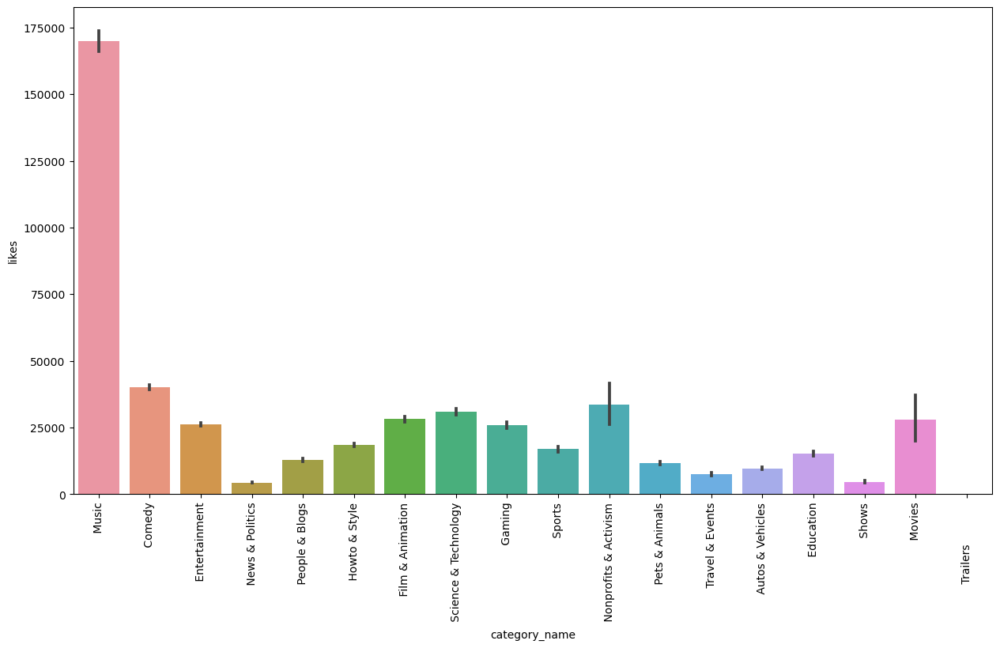

In [92]:
plt.figure(figsize=(15,8))
sns.barplot(x='category_name', y='likes', data = full_df)
plt.xticks(rotation = 'vertical')

In [98]:
# For Json file
import json
with open(r'C:/Users/abhis/Downloads/Compressed/Data/Youtube_project_shan_singh/additional_data/US_category_id.json') as f: categories = json.load(f)

In [99]:
categories

{'kind': 'youtube#videoCategoryListResponse',
 'etag': '"m2yskBQFythfE4irbTIeOgYYfBU/S730Ilt-Fi-emsQJvJAAShlR6hM"',
 'items': [{'kind': 'youtube#videoCategory',
   'etag': '"m2yskBQFythfE4irbTIeOgYYfBU/Xy1mB4_yLrHy_BmKmPBggty2mZQ"',
   'id': '1',
   'snippet': {'channelId': 'UCBR8-60-B28hp2BmDPdntcQ',
    'title': 'Film & Animation',
    'assignable': True}},
  {'kind': 'youtube#videoCategory',
   'etag': '"m2yskBQFythfE4irbTIeOgYYfBU/UZ1oLIIz2dxIhO45ZTFR3a3NyTA"',
   'id': '2',
   'snippet': {'channelId': 'UCBR8-60-B28hp2BmDPdntcQ',
    'title': 'Autos & Vehicles',
    'assignable': True}},
  {'kind': 'youtube#videoCategory',
   'etag': '"m2yskBQFythfE4irbTIeOgYYfBU/nqRIq97-xe5XRZTxbknKFVe5Lmg"',
   'id': '10',
   'snippet': {'channelId': 'UCBR8-60-B28hp2BmDPdntcQ',
    'title': 'Music',
    'assignable': True}},
  {'kind': 'youtube#videoCategory',
   'etag': '"m2yskBQFythfE4irbTIeOgYYfBU/HwXKamM1Q20q9BN-oBJavSGkfDI"',
   'id': '15',
   'snippet': {'channelId': 'UCBR8-60-B28hp2BmDPdnt

In [100]:
cat_dict ={}
for i in categories['items']:
    cat_dict[int(i['id'])] = i['snippet']['title']
cat_dict

{1: 'Film & Animation',
 2: 'Autos & Vehicles',
 10: 'Music',
 15: 'Pets & Animals',
 17: 'Sports',
 18: 'Short Movies',
 19: 'Travel & Events',
 20: 'Gaming',
 21: 'Videoblogging',
 22: 'People & Blogs',
 23: 'Comedy',
 24: 'Entertainment',
 25: 'News & Politics',
 26: 'Howto & Style',
 27: 'Education',
 28: 'Science & Technology',
 29: 'Nonprofits & Activism',
 30: 'Movies',
 31: 'Anime/Animation',
 32: 'Action/Adventure',
 33: 'Classics',
 34: 'Comedy',
 35: 'Documentary',
 36: 'Drama',
 37: 'Family',
 38: 'Foreign',
 39: 'Horror',
 40: 'Sci-Fi/Fantasy',
 41: 'Thriller',
 42: 'Shorts',
 43: 'Shows',
 44: 'Trailers'}

In [101]:
full_df['category_name'] = full_df['category_id'].map(cat_dict)

# To find whether audience is engaged

In [102]:
full_df.head(1)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country,category_name
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music


In [103]:
full_df['like_rate'] = (full_df['likes']/full_df['views'])*100
full_df['dislike_rate'] = (full_df['dislikes']/full_df['views'])*100
full_df['commentcount_rate'] = (full_df['comment_count']/full_df['views'])*100

In [104]:
full_df.head(3)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country,category_name,like_rate,dislike_rate,commentcount_rate
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,...,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music,4.589104,0.253051,0.733639
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,...,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy,12.594873,0.166363,1.284185
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,...,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy,4.575843,0.167292,0.256342


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, 'Music'),
  Text(1, 0, 'Comedy'),
  Text(2, 0, 'Entertainment'),
  Text(3, 0, 'News & Politics'),
  Text(4, 0, 'People & Blogs'),
  Text(5, 0, 'Howto & Style'),
  Text(6, 0, 'Film & Animation'),
  Text(7, 0, 'Science & Technology'),
  Text(8, 0, 'Gaming'),
  Text(9, 0, 'Sports'),
  Text(10, 0, 'Nonprofits & Activism'),
  Text(11, 0, 'Pets & Animals'),
  Text(12, 0, 'Travel & Events'),
  Text(13, 0, 'Autos & Vehicles'),
  Text(14, 0, 'Education'),
  Text(15, 0, 'Shows'),
  Text(16, 0, 'Movies'),
  Text(17, 0, 'Trailers')])

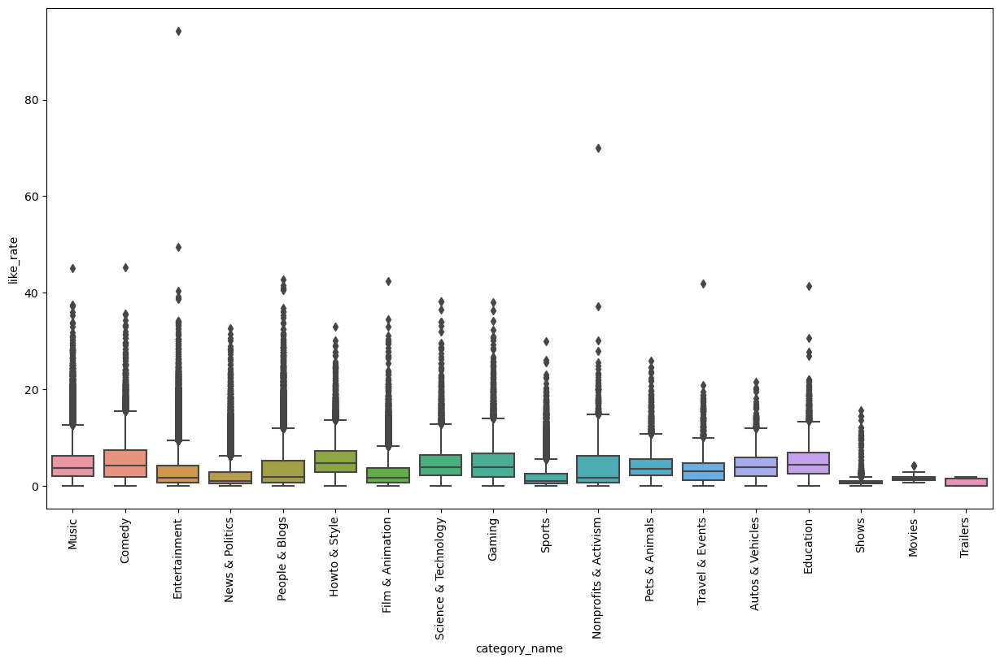

In [105]:
plt.figure(figsize=(15,8))
sns.boxplot(x='category_name',y='like_rate', data = full_df)
plt.xticks(rotation='vertical')

<AxesSubplot:xlabel='views', ylabel='likes'>

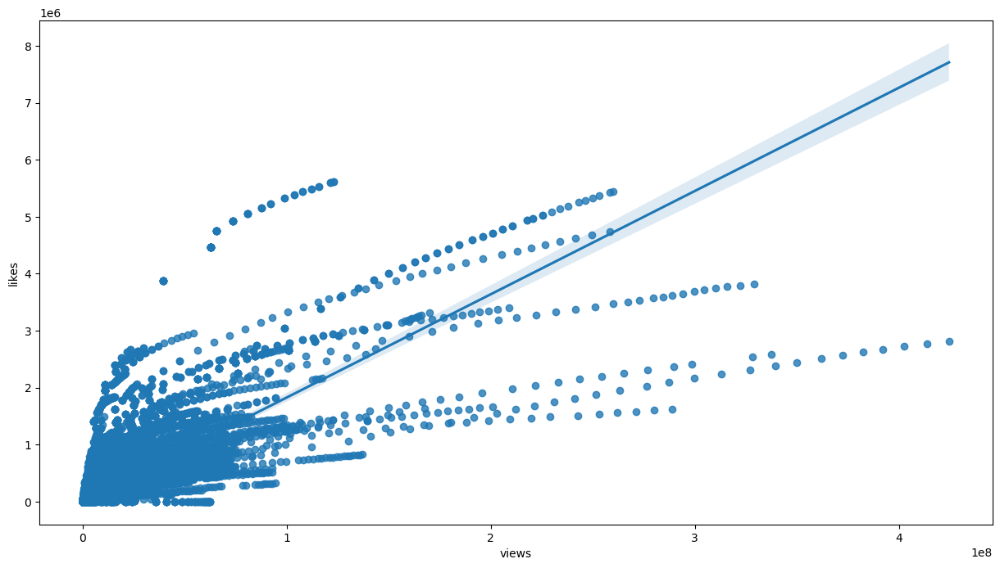

In [106]:
# Relationship between views and likes
plt.figure(figsize=(15,8))
sns.regplot(x='views',y='likes',data = full_df)

In [111]:
full_df[['views','likes','dislikes']].corr()

,views,likes,dislikes
views,1.000000,0.777796,0.421653
likes,0.777796,1.000000,0.453710
dislikes,0.421653,0.453710,1.000000


<AxesSubplot:>

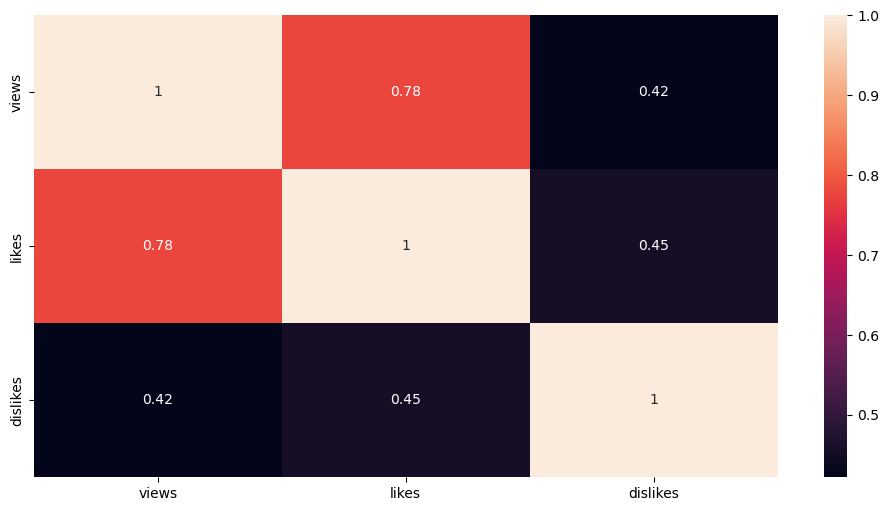

In [112]:
#Correlation values between views, likes and dislikes
plt.figure(figsize=(12,6))
sns.heatmap(full_df[['views','likes','dislikes']].corr(), annot= True)

In [113]:
full_df.head(3)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country,category_name,like_rate,dislike_rate,commentcount_rate
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,...,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music,4.589104,0.253051,0.733639
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,...,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy,12.594873,0.166363,1.284185
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,...,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy,4.575843,0.167292,0.256342


<AxesSubplot:xlabel='views', ylabel='likes'>

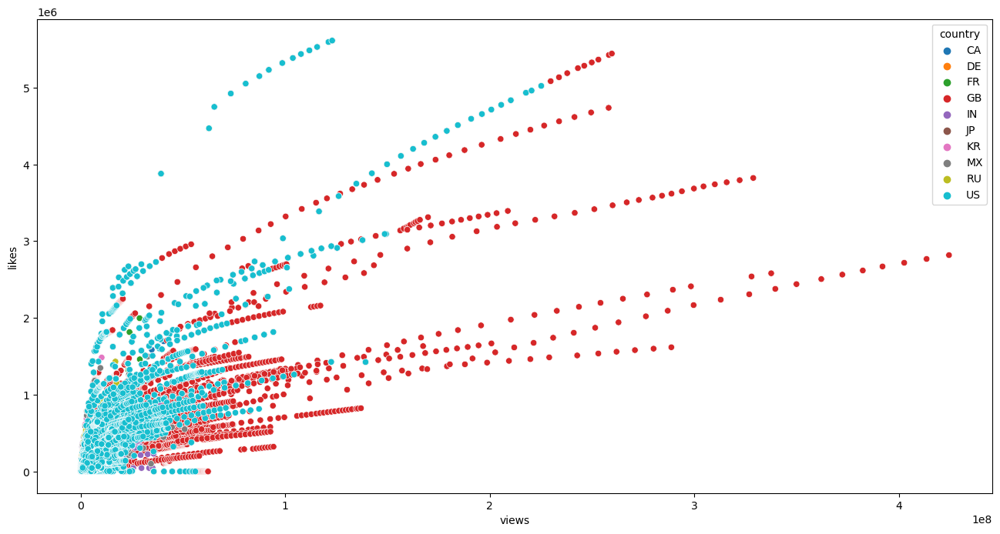

In [114]:
plt.figure(figsize=(16,8))
sns.scatterplot(x=full_df["views"], y=full_df["likes"], hue=full_df["country"])

# Analyzing Trending Videos

In [120]:
full_df.head(3)

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country,category_name,like_rate,dislike_rate,commentcount_rate
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,...,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music,4.589104,0.253051,0.733639
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,...,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy,12.594873,0.166363,1.284185
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,...,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy,4.575843,0.167292,0.256342


In [121]:
atv = full_df.groupby('channel_title')['video_id'].count().sort_values(ascending=False).to_frame().reset_index().rename(columns={'video_id': 'total_videos'})

In [122]:
atv

,channel_title,total_videos
0,The Late Show with Stephen Colbert,984
1,WWE,804
2,Late Night with Seth Meyers,773
3,VikatanTV,763
4,TheEllenShow,743
...,...,...
37819,LIGHTS - 001 jrny,1
37820,bangtanist,1
37821,LIGAMX Femenil,1
37822,LIGA COLOMBIANA OFICIAL,1


In [123]:
import plotly.express as px
px.bar(data_frame = atv[0:20], x = 'channel_title', y='total_videos')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 [Text(0, 0, 'The Late Show with Stephen Colbert'),
  Text(1, 0, 'WWE'),
  Text(2, 0, 'Late Night with Seth Meyers'),
  Text(3, 0, 'VikatanTV'),
  Text(4, 0, 'TheEllenShow'),
  Text(5, 0, 'Jimmy Kimmel Live'),
  Text(6, 0, 'The Tonight Show Starring Jimmy Fallon'),
  Text(7, 0, 'PewDiePie'),
  Text(8, 0, 'RadaanMedia'),
  Text(9, 0, 'The Late Late Show with James Corden'),
  Text(10, 0, 'CNN'),
  Text(11, 0, 'Netflix'),
  Text(12, 0, 'FBE'),
  Text(13, 0, 'MLG Highlights'),
  Text(14, 0, 'SET India'),
  Text(15, 0, 'Screen Junkies'),
  Text(16, 0, 'ESPN'),
  Text(17, 0, 'Marvel Entertainment'),
  Text(18, 0, 'BuzzFeedVideo'),
  Text(19, 0, 'Warner Bros. Pictures')])

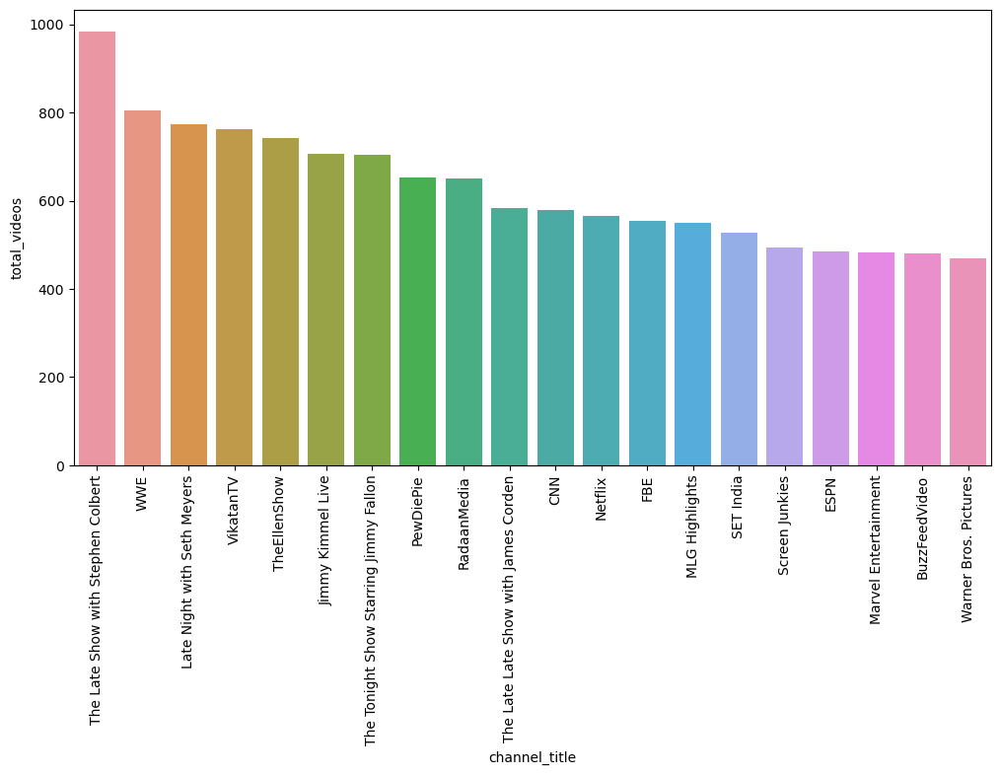

In [124]:
plt.figure(figsize=(12,6))
sns.barplot(data=atv[0:20],x='channel_title',y='total_videos')
plt.xticks(rotation='vertical')

# Does punctuation affect views?

In [125]:
import string

In [126]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [127]:
sample_df = full_df[0:10000]

In [128]:
def punc_count(x):
    punc = []
    for i in x:
        for c in i:
            if c in string.punctuation:
                punc.append(c)
    return len(punc)

In [129]:
sample_df.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country,category_name,like_rate,dislike_rate,commentcount_rate
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,...,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music,4.589104,0.253051,0.733639
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,...,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy,12.594873,0.166363,1.284185
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,...,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy,4.575843,0.167292,0.256342
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,...,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,CA,Entertainment,6.309630,0.094903,0.835851
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,...,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,ð§: https://ad.gt/yt-perfect\nð°: https://...,CA,Music,4.874563,0.062887,0.253752


In [130]:
text = sample_df['title'][0]
text

'Eminem - Walk On Water (Audio) ft. BeyoncÃ©'

In [131]:
punc_count(text)

4

In [132]:
sample_df['punc_count'] =  sample_df['title'].apply(punc_count)

C:\Users\abhis\AppData\Local\Temp\ipykernel_7396\763496449.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [133]:
sample_df.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,comments_disabled,ratings_disabled,video_error_or_removed,description,country,category_name,like_rate,dislike_rate,commentcount_rate,punc_count
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,...,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music,4.589104,0.253051,0.733639,4
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,...,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy,12.594873,0.166363,1.284185,1
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,...,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy,4.575843,0.167292,0.256342,3
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,...,False,False,False,I know it's been a while since we did this sho...,CA,Entertainment,6.309630,0.094903,0.835851,3
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,...,False,False,False,ð§: https://ad.gt/yt-perfect\nð°: https://...,CA,Music,4.874563,0.062887,0.253752,3


<AxesSubplot:xlabel='punc_count', ylabel='views'>

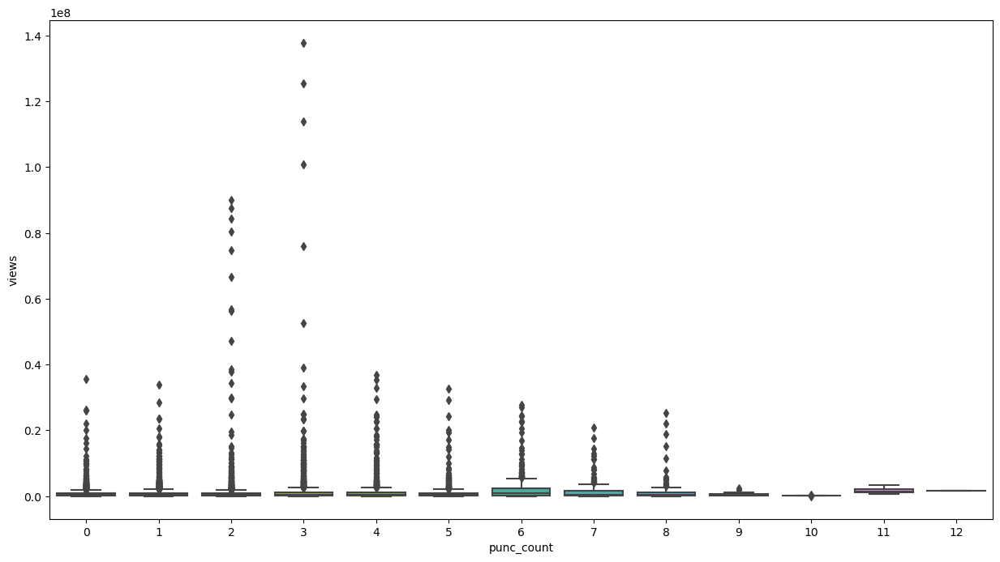

In [134]:
plt.figure(figsize=(15,8))
sns.boxplot(data= sample_df, x = 'punc_count',y='views')

In [135]:
sample_df['punc_count'].corr(sample_df['views'])*100

6.510009783044859